Importing all the necessary libraries 

In [2]:
import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt 

Getting datasets and Loading them into train and test files 

In [3]:
data_train= loadmat('train_set.mat')
data_test= loadmat('test_set.mat')

In [4]:
x_train= data_train['data']
y_train= data_train['labels']
x_train.shape, y_train.shape

((320, 10304), (1, 320))

In [5]:
x_test= data_test['data']
y_test= data_test['labels']
x_test.shape, y_test.shape

((80, 10304), (1, 80))

Displaying Images for train and test data 

In [6]:
unique_labels_train = np.unique(y_train)
x_train_unq = [x_train[y_train.flatten() == label][0] for label in unique_labels_train]

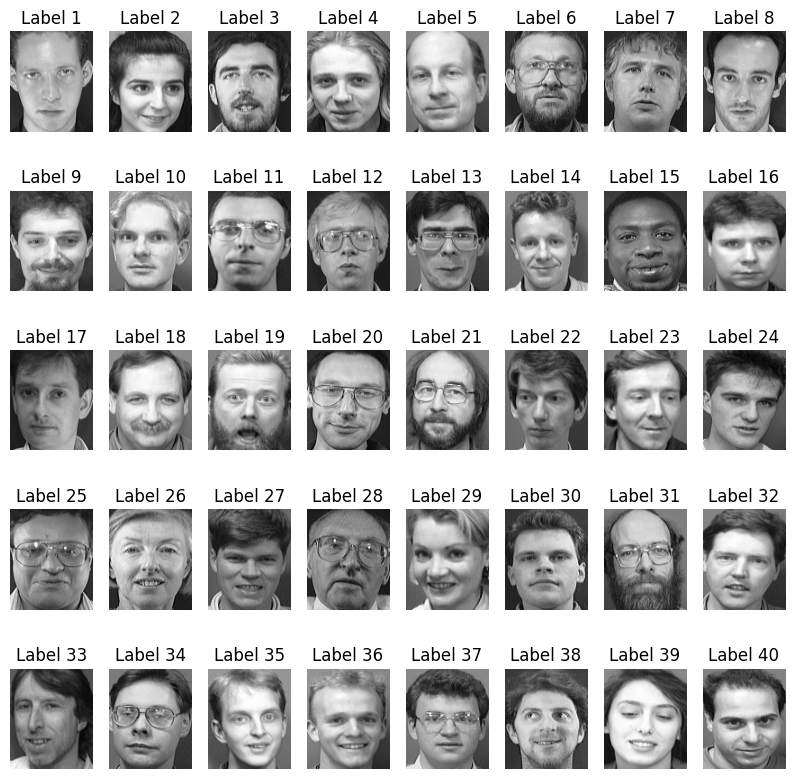

In [7]:
fig, axs = plt.subplots(nrows=5, ncols=8, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    img = x_train_unq[i].reshape(112,92)
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Label {i+1}")
    ax.axis("off")
plt.show()

In [8]:
unique_labels_test = np.unique(y_test)
x_test_unq = [x_test[y_test.flatten() == label][0] for label in unique_labels_test]

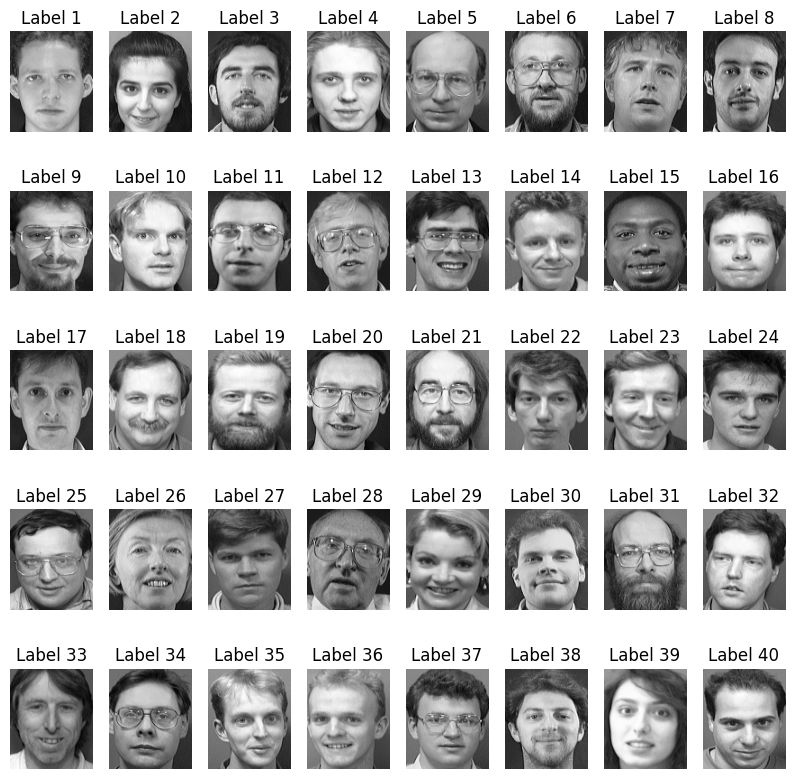

In [9]:
fig, axs = plt.subplots(nrows=5, ncols=8, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    img = x_test_unq[i].reshape(112,92)
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Label {i+1}")
    ax.axis("off")
plt.show()

Calculating Mean Image

(-0.5, 91.5, 111.5, -0.5)

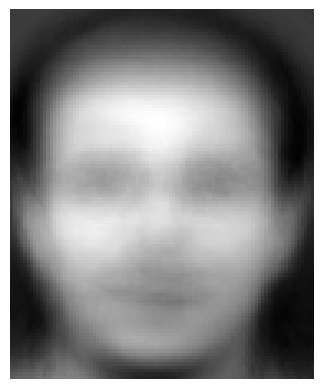

In [10]:
mean = np.mean(x_train, axis=0)
plt.imshow(mean.reshape(112,92), cmap='gray')
plt.axis("off")

Centralising Train and Test data

In [11]:
x_train_centralised = x_train - mean
x_test_centralised = x_test - mean
x_train.shape, mean.shape

((320, 10304), (10304,))

Visualising data for train and test datasets 

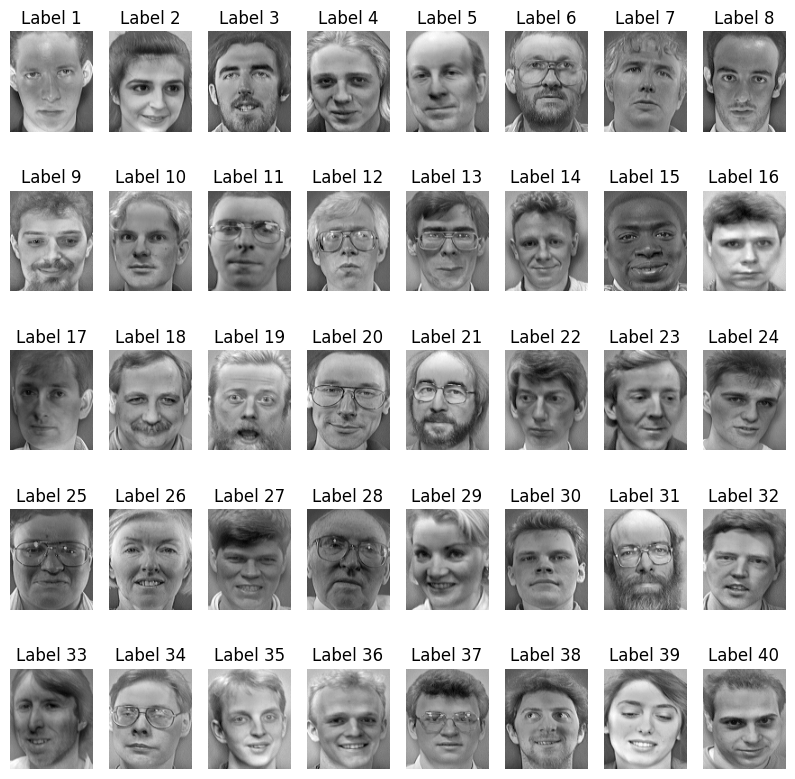

In [12]:
fig, axs = plt.subplots(nrows=5, ncols=8, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    img = x_train_unq[i].reshape(112,92)-mean.reshape(112,92)
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Label {i+1}")
    ax.axis("off")
plt.show()

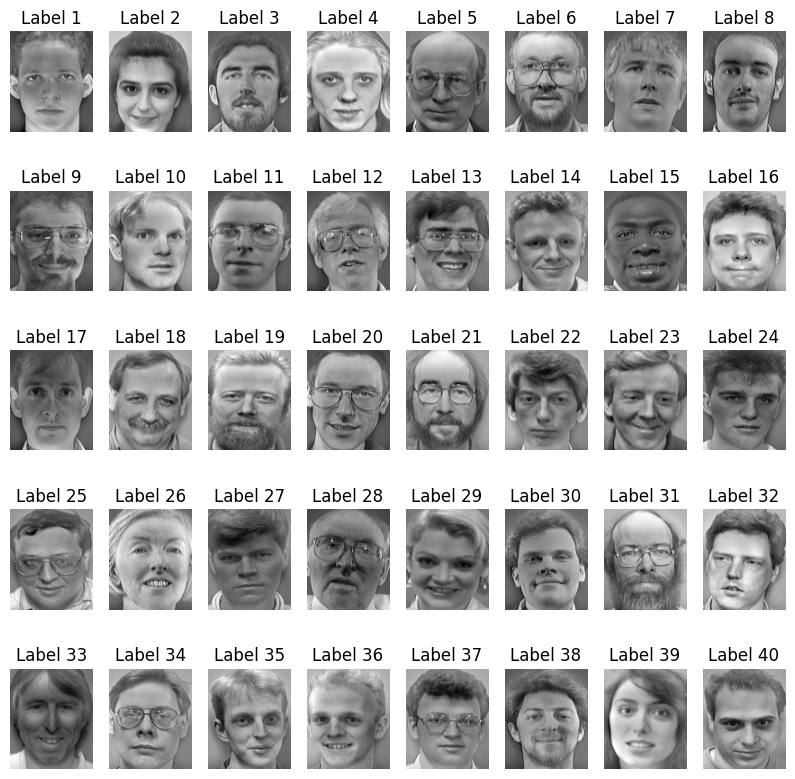

In [13]:
fig, axs = plt.subplots(nrows=5, ncols=8, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    img = x_test_unq[i].reshape(112,92)-mean.reshape(112,92)
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Label {i+1}")
    ax.axis("off")
plt.show()

Covariance Matrix

In [14]:
cov_matrix_x_train= np.cov(x_train_centralised.T)
cov_matrix_x_train.shape

(10304, 10304)

Calculating Eigen values and Eigen vectors

In [15]:
eigen_values, eigen_vectors = np.linalg.eigh(cov_matrix_x_train)

In [16]:
eigen_vectors.shape

(10304, 10304)

sorting eigen vectors and eigen values in descing order

In [17]:
eigen_vectors_ordered = eigen_vectors[:,::-1]
eigen_values_ordered = eigen_values[::-1]

Calculating Variance explained by each principal component

we print it only 25 times because then we will get 10304 lines of this output in pdf

In [35]:
net_var = np.sum(eigen_values_ordered)  
var_per = eigen_values_ordered / net_var * 100
for i in range(30) :
    print('Variance explained by PC-' + str(i+1) +' is ' + str(round(eigen_values_ordered[i],4)) + ' that is ' + str(round(var_per[i],4)) + ' percent')
print('........................................')

Variance explained by PC-1 is 2798530.845 that is 17.4306 percent
Variance explained by PC-2 is 2121928.333 that is 13.2164 percent
Variance explained by PC-3 is 1091379.171 that is 6.7976 percent
Variance explained by PC-4 is 918487.8001 that is 5.7208 percent
Variance explained by PC-5 is 824760.524 that is 5.137 percent
Variance explained by PC-6 is 522301.3047 that is 3.2531 percent
Variance explained by PC-7 is 390846.733 that is 2.4344 percent
Variance explained by PC-8 is 387095.5394 that is 2.411 percent
Variance explained by PC-9 is 321570.6949 that is 2.0029 percent
Variance explained by PC-10 is 287954.8708 that is 1.7935 percent
Variance explained by PC-11 is 232959.2025 that is 1.451 percent
Variance explained by PC-12 is 217536.1563 that is 1.3549 percent
Variance explained by PC-13 is 183793.6971 that is 1.1448 percent
Variance explained by PC-14 is 170544.5403 that is 1.0622 percent
Variance explained by PC-15 is 158269.1449 that is 0.9858 percent
Variance explained by 

Calculating number of principal components needed to show 95% variance

In [19]:
k = 95
var_explained = 0 
for i in range(len(var_per)) :
    var_explained += var_per[i] 
    if var_explained >= k :
        break 
print('We would require a total of ' + str(i+1) + ' eigen vectors classify faces correctly.')

We would require a total of 164 eigen vectors classify faces correctly.


Plotting Principal components, variance, we draw two plots because we cant really explain anything from the first plot 

Text(0, 0.5, 'Variance')

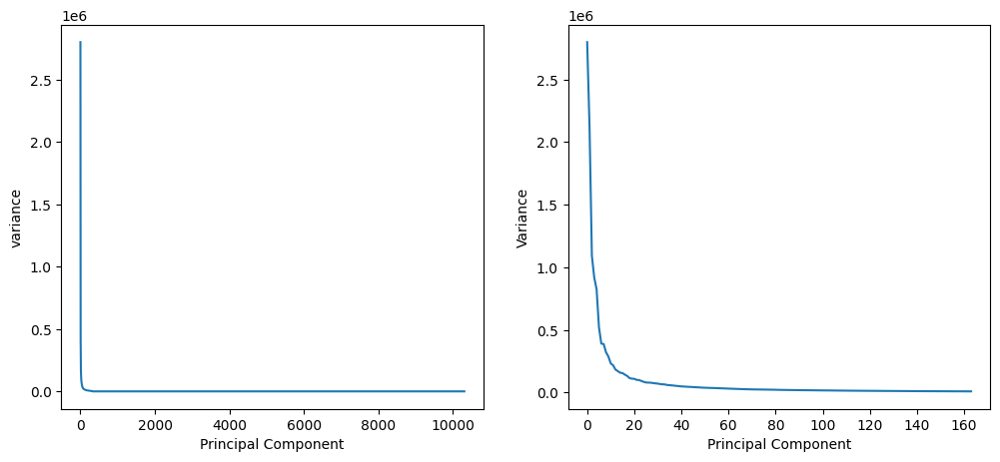

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.plot(eigen_values_ordered)
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('variance')
ax2.plot(eigen_values_ordered[:164])
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Variance')

Plotting eigen faces

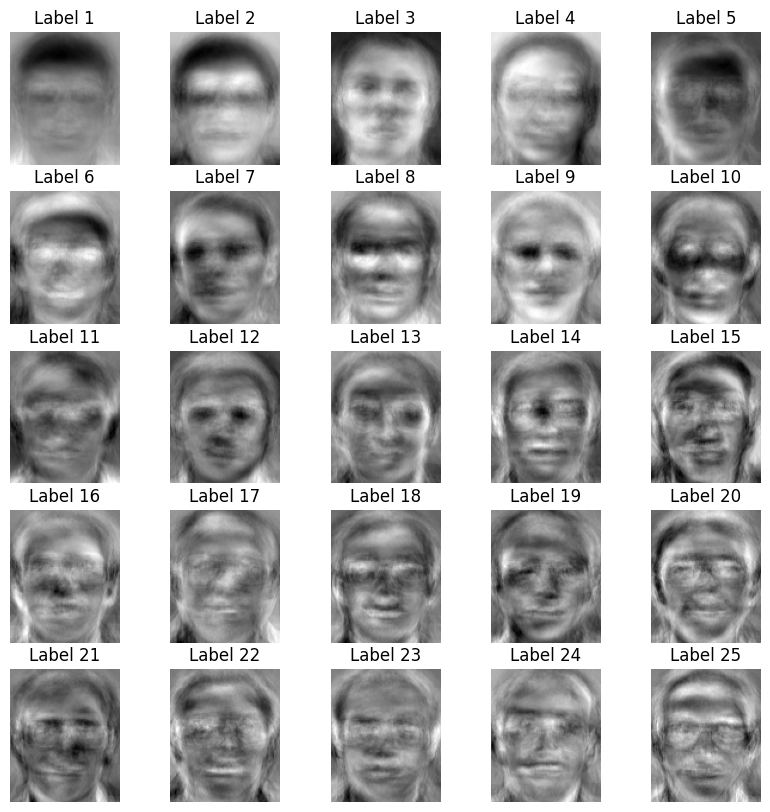

In [21]:
fig, axs= plt.subplots(nrows=5, ncols=5, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    img = eigen_vectors_ordered[:,i].reshape(112,92)
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Label {i+1}")
    ax.axis("off")
plt.show()

selecting the first 164 eigen vectors to reconstruct the data 

In [22]:
eigen_vectors_needed= eigen_vectors_ordered[:,:163]

x_reconstructed is our reconstructed data and our Z is dot product of x_train_centralised and eigen_vectors_needed we get reconstruced by multiplying Z and eigen_vectors_needed Transpose. 
Note that we did not add the mean yet 

In [23]:
x_reconstructed = np.dot(np.dot(x_train_centralised, eigen_vectors_needed) , eigen_vectors_needed.T)
x_reconstructed.shape

(320, 10304)

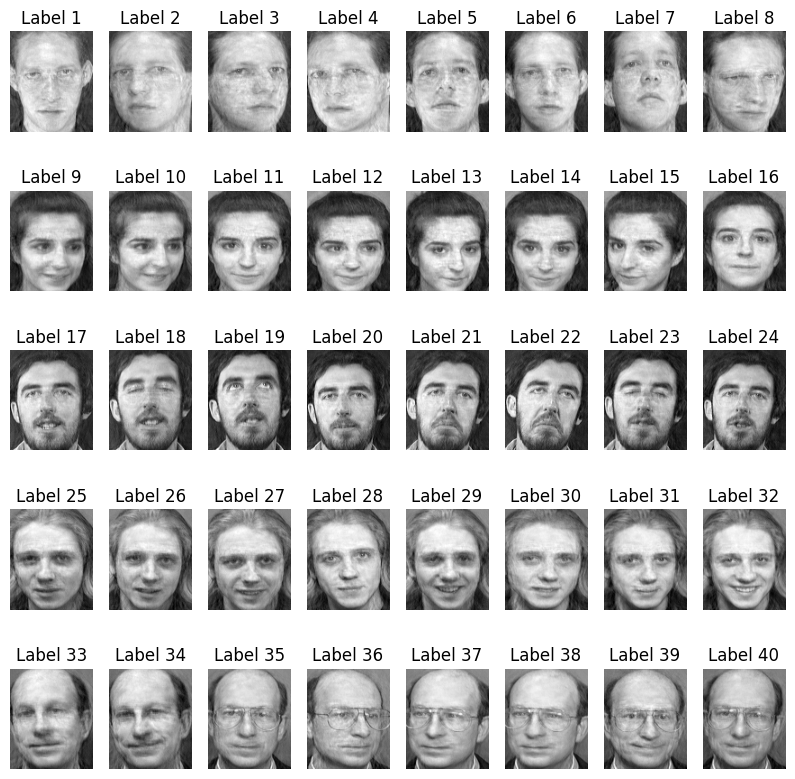

In [36]:
fig, axs= plt.subplots(nrows=5, ncols=8, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    img = x_reconstructed[i].reshape(112,92) + mean.reshape(112,92)
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Label {i+1}")
    ax.axis("off")
plt.show()

This is code just to show all different faces in one plot

In [25]:
unique_labels_recon = np.unique(y_train)
x_reconstructed_unique = [x_reconstructed[y_train.flatten() == label][0] for label in unique_labels_recon]

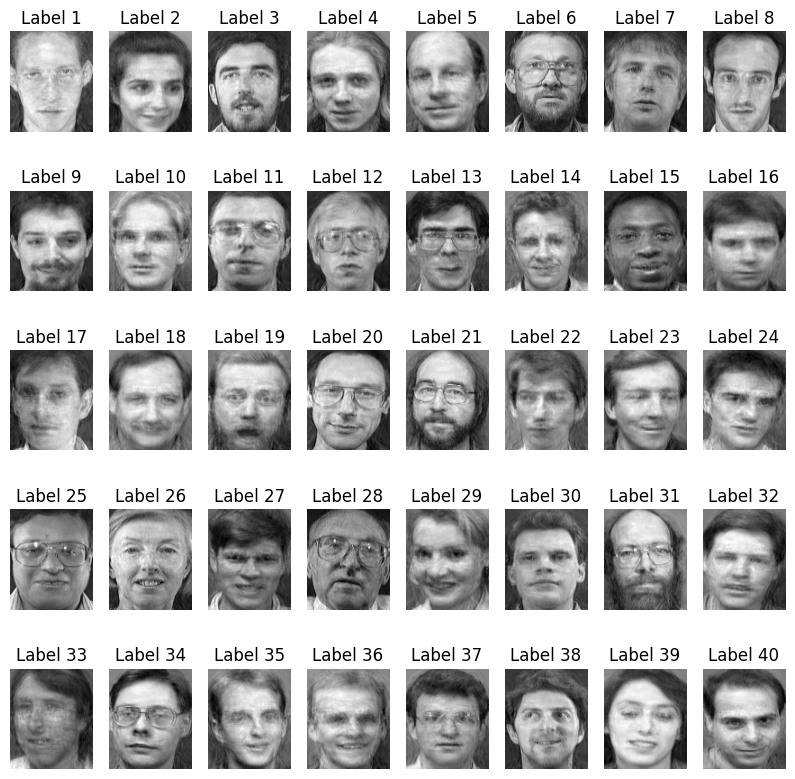

In [26]:
fig, axs= plt.subplots(nrows=5, ncols=8, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    img = x_reconstructed_unique[i].reshape(112,92) + mean.reshape(112,92)
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Label {i+1}")
    ax.axis("off")
plt.show()

In [27]:
x_train_pca= x_reconstructed + mean

In [28]:
x_test_reconstructed= np.dot(np.dot(x_test_centralised, eigen_vectors_needed) , eigen_vectors_needed.T)
x_test_pca = x_test_reconstructed + mean

choosing every point in x_test_pca and calculating distance in x_train_pca and one with least distance is closest sample

In [29]:
closest_samples = [np.argmin(np.linalg.norm(sample_test - x_train_pca , axis = 1)) for sample_test in x_test_pca]

In [30]:
matched_labels = sum(y_train.flatten()[closest_samples] == y_test.flatten())
accuracy = matched_labels / len(y_test.flatten()) * 100.0
print(f"Accuracy: {accuracy:.2f}%")

Accuracy: 98.75%


if we decrease k then it wont fit properley and we will get less accuracy and if increase k then it will overfit and accuracy will  decrease

showing the closest image in train to test

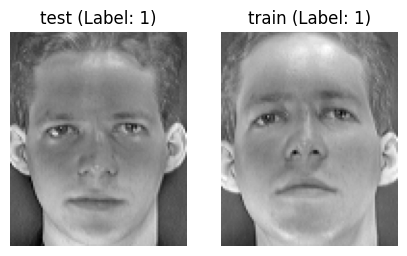

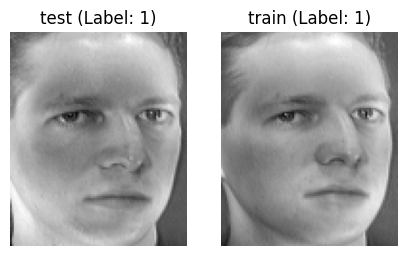

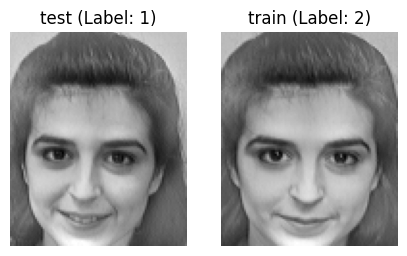

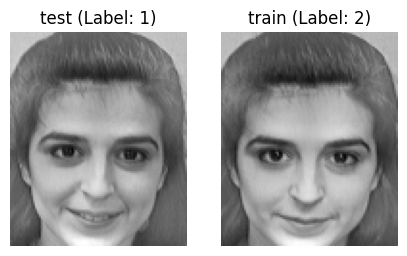

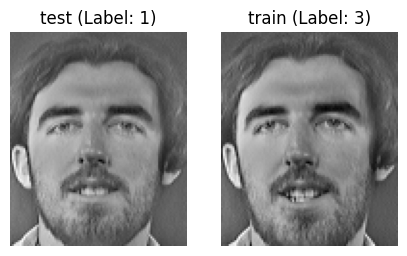

...

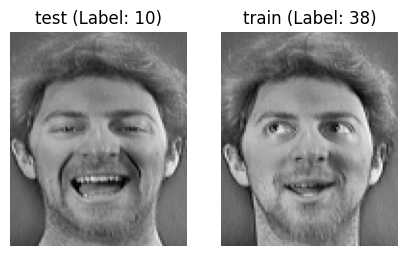

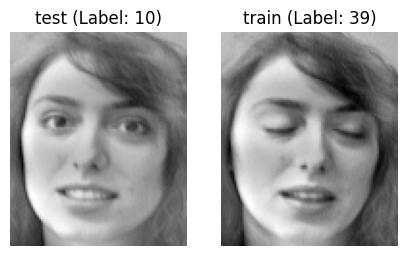

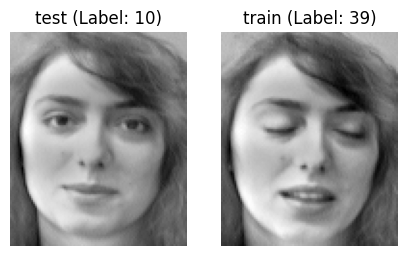

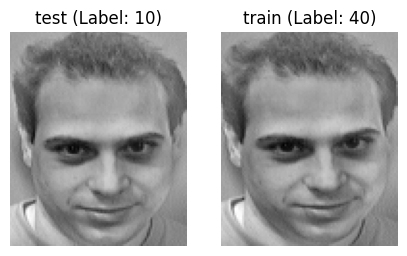

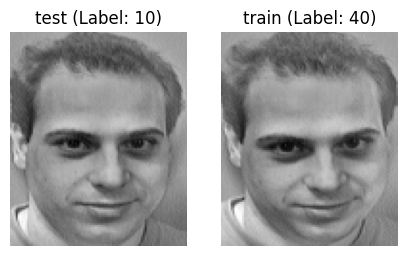

In [31]:
for i, (sample_test, train_sample_idx) in enumerate(zip(x_test_centralised, closest_samples)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(5, 5))
    ax1.imshow(sample_test.reshape(112, 92), cmap="gray")
    ax1.set_title(f"test (Label: {y_train.flatten()[i]+1})")
    ax1.axis("off")
    ax2.imshow(x_train_centralised[train_sample_idx].reshape(112, 92), cmap="gray")
    ax2.set_title(f"train (Label: {y_train.flatten()[train_sample_idx]+1})")
    ax2.axis("off")
    
    plt.show()